In [1]:
import numpy as np
import os
import sys
import astropy as ast
from astropy.io import ascii
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import pandas as pd
import scipy as sp
from astropy.timeseries import LombScargle
from astropy import units as u
import gc
from view_and_clean import get_telescope, find_header_line, modified_zscore, df_extract, individual_plotter, grid_plotter, offset_corrector, offset_corrector_window
from metrics import mean_med_flux, fit_plotter_flux, curve_fitter_flux,\
    largest_amplitude, offset_warning, chi, percentile_amplitude, plot_percentile_amplitude, \
        compute_lomb_scargle, plot_periodogram, plot_phase_fold, amplitude_per_period, amplitude_per_period_plot, sed_plotter

In [2]:
df_lmc = pd.read_csv('/Users/shannonbowes/Research/ysg/candidates_and_lcs/final_lmc_ysgcands.csv', comment='#') # , sep="\\s+"
df_smc = pd.read_csv('/Users/shannonbowes/Research/ysg/candidates_and_lcs/final_smc_ysgcands.csv', comment='#') # , sep="\\s+"
coords = pd.read_csv('merged_smc_lmc_coords.csv', comment='#', sep="\\s+", names=['RA', 'DEC'])
plt.rcParams['font.family'] = 'serif'

In [3]:
def info(index, g=True, change_period=None):
        # plots
        # individual_plotter(index, seeoutliers=True)
        df, telescopes = offset_corrector(index, g=g, mag_space=True, show_window=False)
        try:
                lombs = compute_lomb_scargle(index, df=df, telescopes=telescopes, g=g, auto=False, samples_per_peak=10)
                if change_period is None:
                        best_period = lombs['best_period']
                else:
                        best_period = change_period
                plot_periodogram(index, lombs['frequency'], lombs['power'], lombs['best_frequency'], lombs['false_alarm_level'], lombs['peaks'], lombs['observation_period'], show_best=True)
                plot_phase_fold(index, best_period, phase_bins=2, mag_space=True)
                sed_plotter(index)
                # computations
                overall_mean, means, overall_median, medians, overall_mags_mean, overall_mags_median, mags_means, mags_medians = mean_med_flux(index, df=df, telescopes=telescopes)
                chi_squared_95, chi2_threshold_95, dof_95, chi_flag_95 = chi(index, df=df, telescopes=telescopes, g=g, confidence=0.95)
                chi_squared_997, chi2_threshold_997, dof_997, chi_flag_997 = chi(index, df=df, telescopes=telescopes, g=g, confidence=0.997)
                chi_squared_68, chi2_threshold_68, dof_68, chi_flag_68 = chi(index, df=df, telescopes=telescopes, g=g, confidence=0.68)
                # offset_flag = offset_warning(index)
                lombs = compute_lomb_scargle(index, df=df, telescopes=telescopes, g=g, auto=False, median=False, subtract_median=False, samples_per_peak=10, report=False)
                alarm_level_flag = lombs['alarm_level_flag']
                print(lombs['peaks'])
                amplitude_5, lower_percentile_5, upper_percentile_5, mag_amplitude_5 = percentile_amplitude(index, df=df, telescopes=telescopes, g=g, tails=5)
                amplitude_1, lower_percentile_1, upper_percentile_1, mag_amplitude_1 = percentile_amplitude(index, df=df, telescopes=telescopes, g=g, tails=1)
                largest_amp = largest_amplitude(index, df=df, telescopes=telescopes, g=g)
                result = amplitude_per_period(index, best_period, df=df, telescopes=telescopes, g=g, report=False)

        except Exception as e:
                print(f"An error occurred while processing index {index}: {e}")
                return
        # std_amp = result['std_amplitude']
        

# x as other_type

In [4]:
# info(442) # has other_type X 
# info(549)
# info(569)
# info(734) # has other_type X AND is classical cepheid

# Stars from looking at the HRD coloured by period

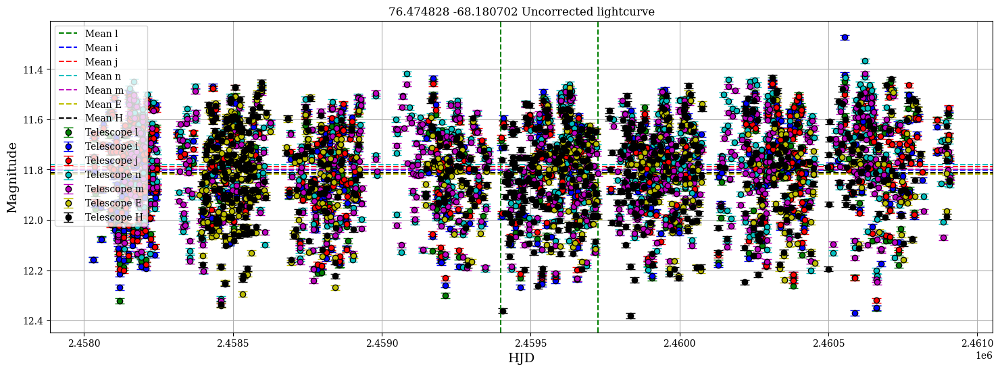

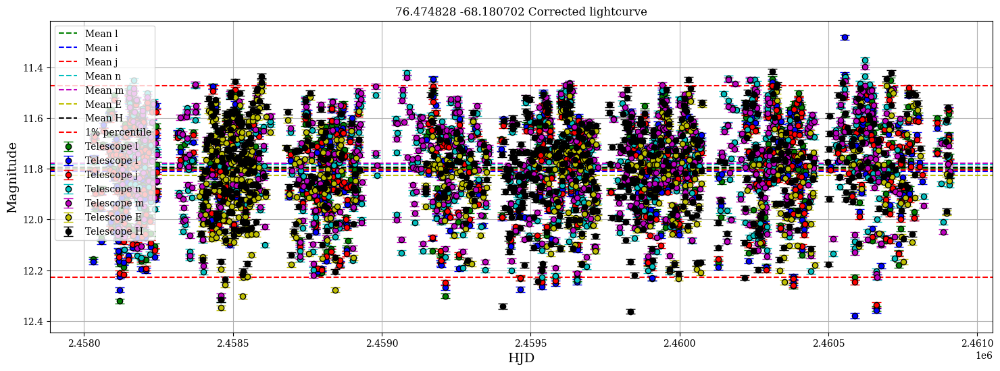

Best frequency: 0.489514 1/day, Best period: 2.04 days, Max power: 0.133, False alarm probability: 1.658e-130
False alarm level for 1.0%: 6.810e-03
Grid sampled at 39092 points


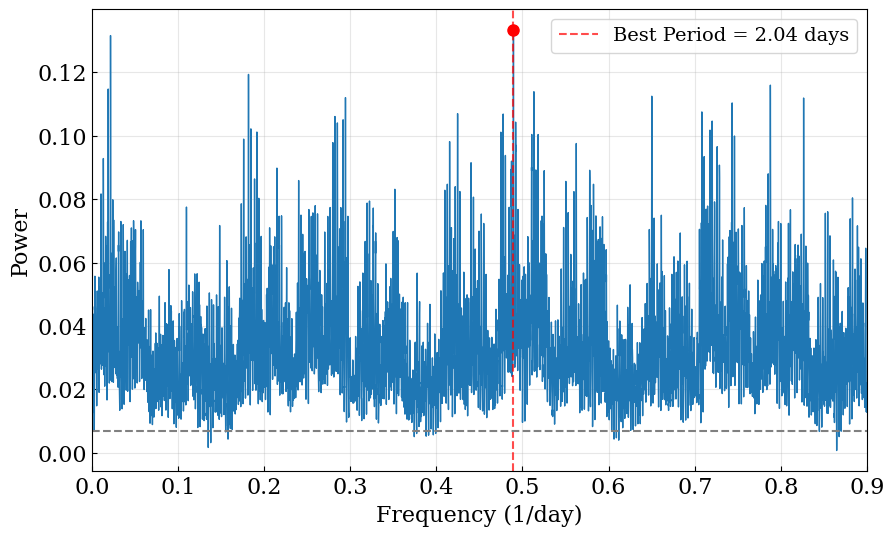

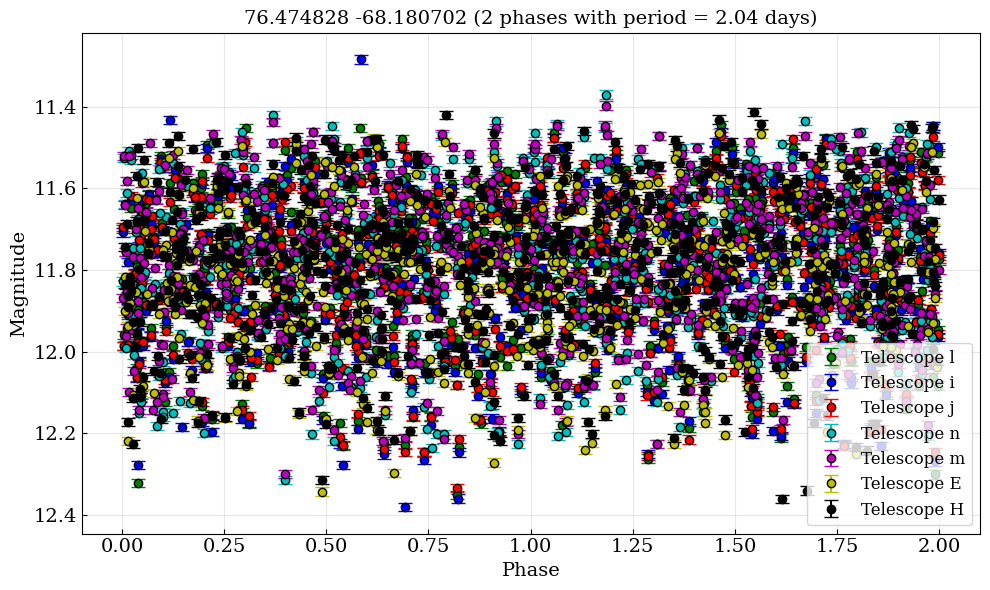

Average scatter (amplitude) per 10 point phase bin: 25.637 mJy


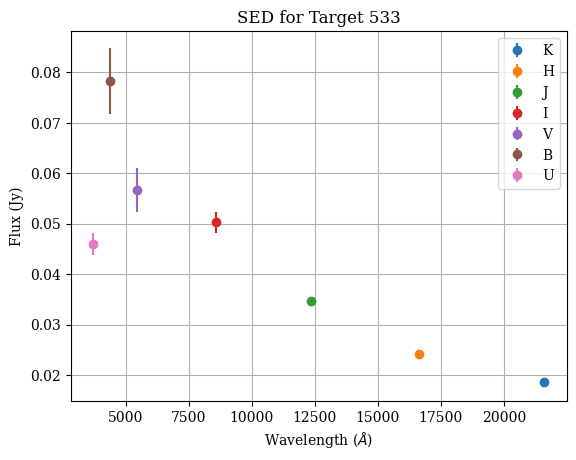

[7.17963295e-04 1.27009348e-03 1.61517484e-03 ... 8.98596669e-01
 8.99539892e-01 8.99838962e-01]
Amplitude metrics:
	Lower 5% percentile: -18.92 mJy, 11.53 mags
	Upper 5% percentile: 18.27 mJy, 12.12 mags
	Percentile amplitude of variability (excluding the brightest and dimmest 5% of data) (g-band: True): 37.19 mJy, 0.59 mags
Amplitude metrics:
	Lower 1% percentile: -23.73 mJy, 11.47 mags
	Upper 1% percentile: 23.18 mJy, 12.23 mags
	Percentile amplitude of variability (excluding the brightest and dimmest 1% of data) (g-band: True): 46.91 mJy, 0.76 mags
	Largest amplitude of variability (g-band: True): 70.89 mJy, 1.10 mags
	Average amplitude across all periods: 8.982 mJy
	Standard deviation of amplitudes: 5.535 mJy


In [5]:
info(533)

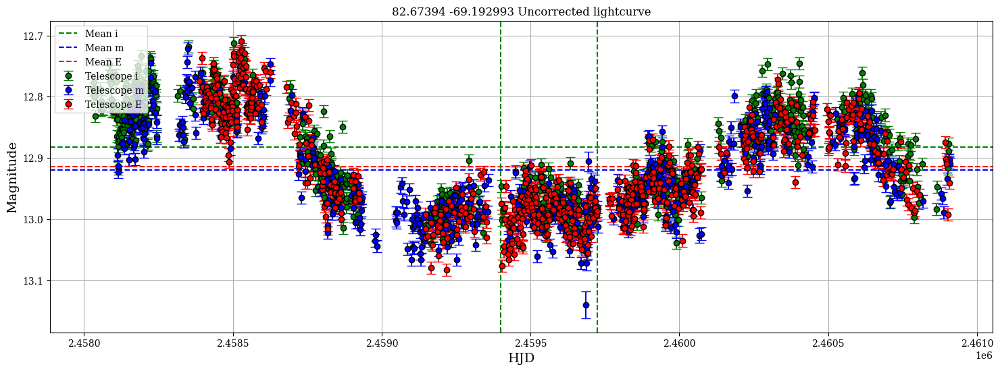

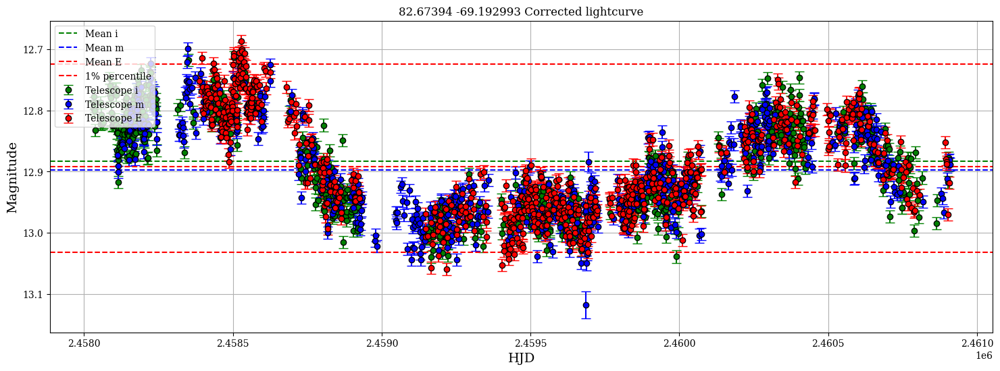

Best frequency: 0.002399 1/day, Best period: 416.82 days, Max power: 0.099, False alarm probability: 6.559e-41
False alarm level for 1.0%: 1.432e-02
Grid sampled at 17941 points


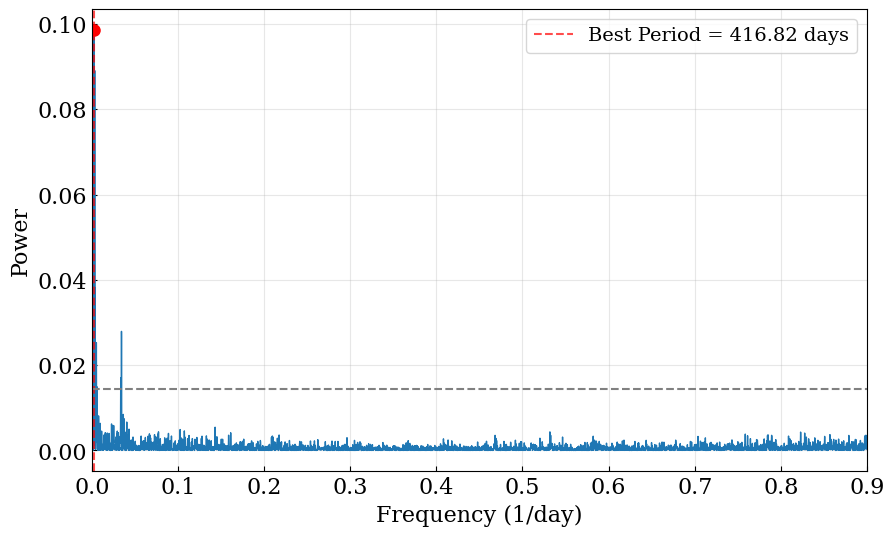

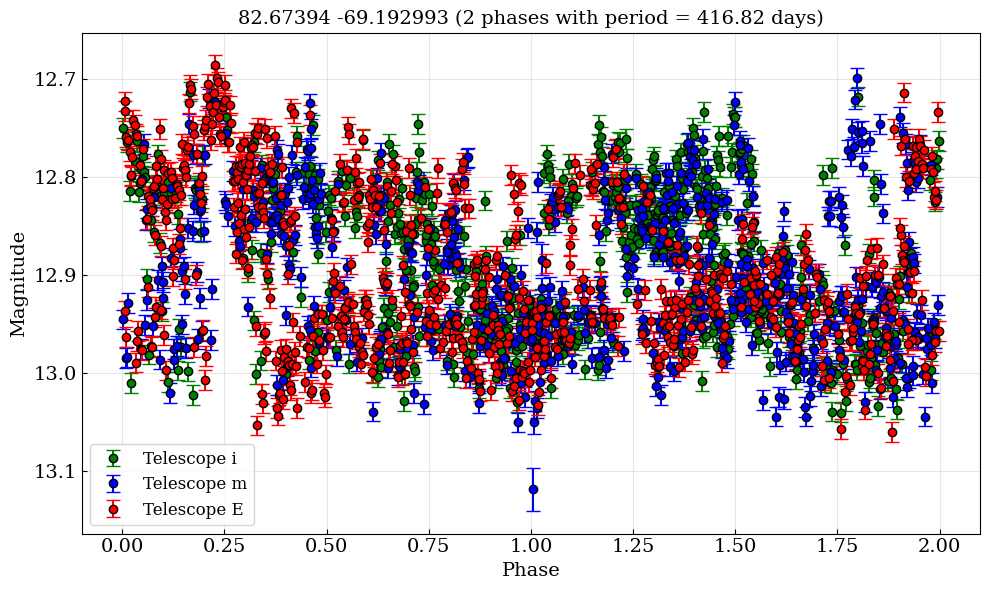

Average scatter (amplitude) per 10 point phase bin: 4.204 mJy


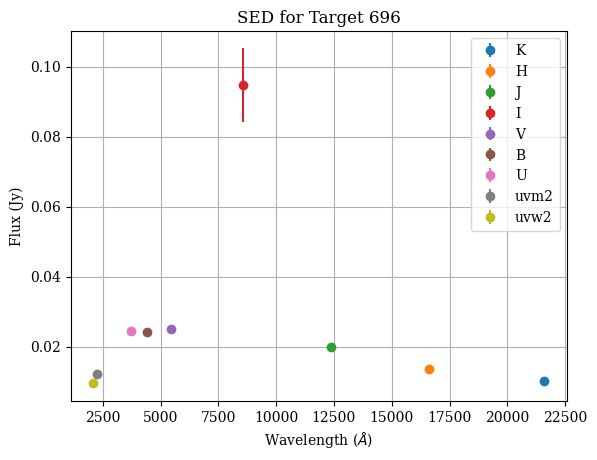

[0.00094536 0.00239909 0.00325127 0.00515616 0.0057577  0.03347876
 0.03433094]
Amplitude metrics:
	Lower 5% percentile: -2.25 mJy, 12.76 mags
	Upper 5% percentile: 3.39 mJy, 13.00 mags
	Percentile amplitude of variability (excluding the brightest and dimmest 5% of data) (g-band: True): 5.64 mJy, 0.24 mags
Amplitude metrics:
	Lower 1% percentile: -2.83 mJy, 12.72 mags
	Upper 1% percentile: 4.45 mJy, 13.03 mags
	Percentile amplitude of variability (excluding the brightest and dimmest 1% of data) (g-band: True): 7.28 mJy, 0.31 mags
	Largest amplitude of variability (g-band: True): 10.02 mJy, 0.43 mags
	Average amplitude across all periods: 5.390 mJy
	Standard deviation of amplitudes: 1.210 mJy


In [6]:
info(696)

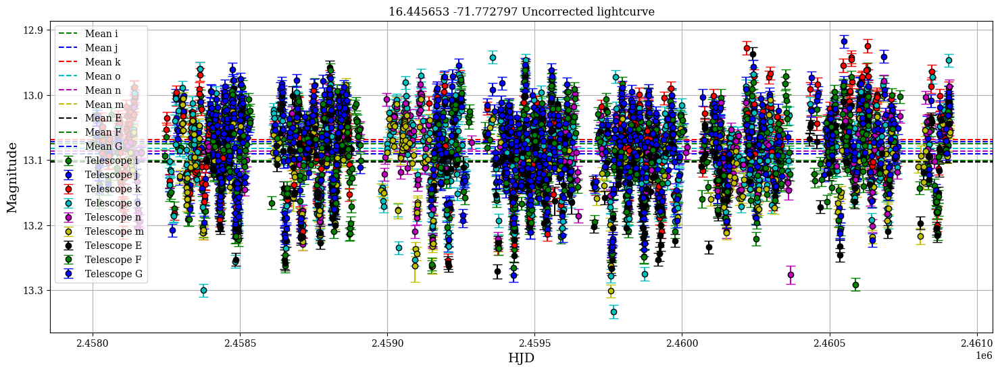

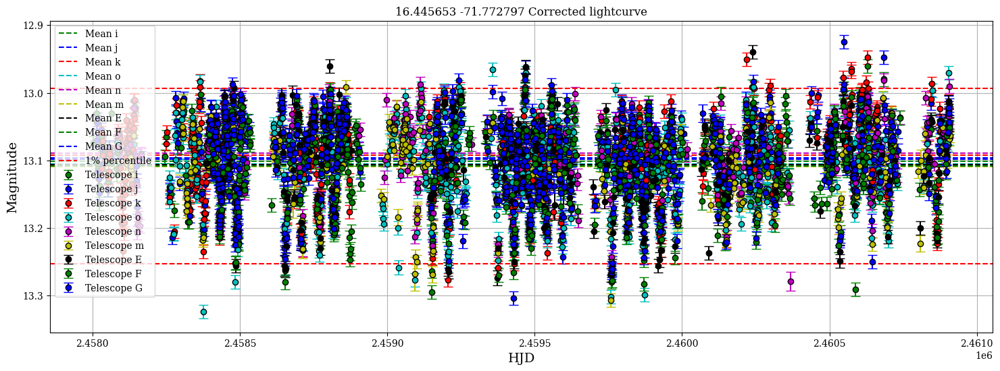

Best frequency: 0.036285 1/day, Best period: 27.56 days, Max power: 0.210, False alarm probability: 7.077e-207
False alarm level for 1.0%: 7.146e-03
Grid sampled at 37114 points


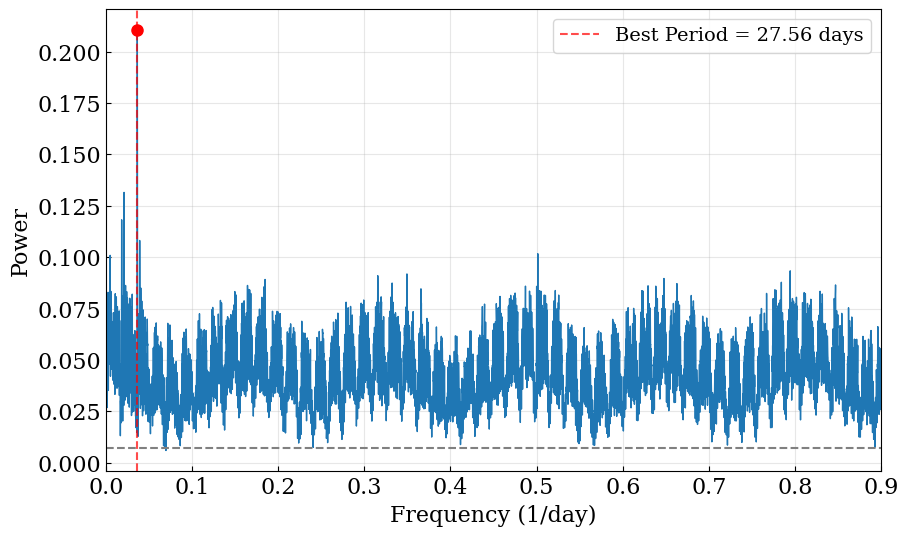

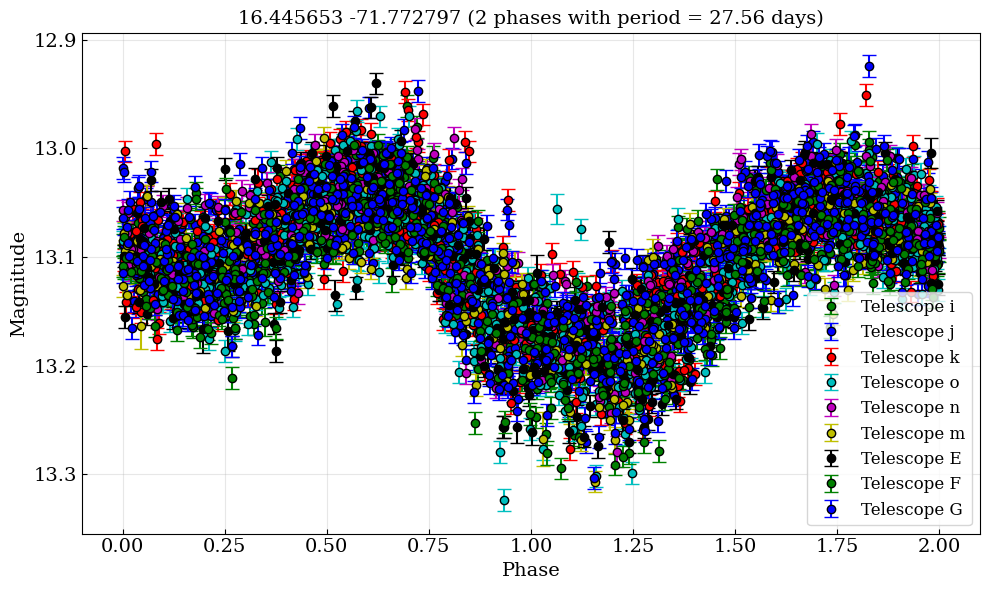

Average scatter (amplitude) per 10 point phase bin: 1.890 mJy


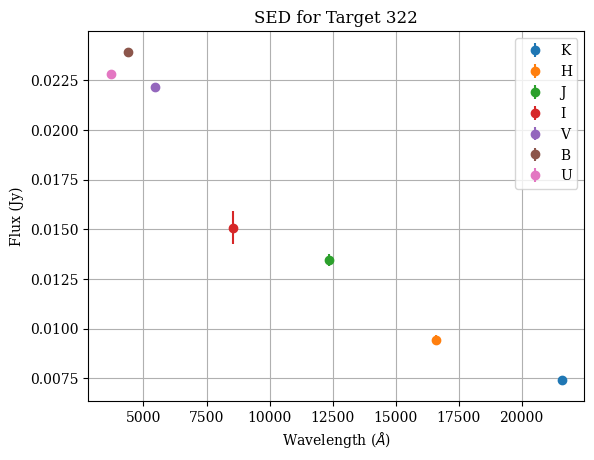

[0.00105158 0.00185123 0.00240856 ... 0.89813416 0.89866726 0.89956383]
Amplitude metrics:
	Lower 5% percentile: -2.14 mJy, 13.02 mags
	Upper 5% percentile: 1.53 mJy, 13.21 mags
	Percentile amplitude of variability (excluding the brightest and dimmest 5% of data) (g-band: True): 3.67 mJy, 0.19 mags
Amplitude metrics:
	Lower 1% percentile: -2.89 mJy, 12.99 mags
	Upper 1% percentile: 2.00 mJy, 13.25 mags
	Percentile amplitude of variability (excluding the brightest and dimmest 1% of data) (g-band: True): 4.89 mJy, 0.26 mags
	Largest amplitude of variability (g-band: True): 7.56 mJy, 0.40 mags
	Average amplitude across all periods: 4.038 mJy
	Standard deviation of amplitudes: 0.942 mJy


In [7]:
info(322) # clear phase fold but bad LS

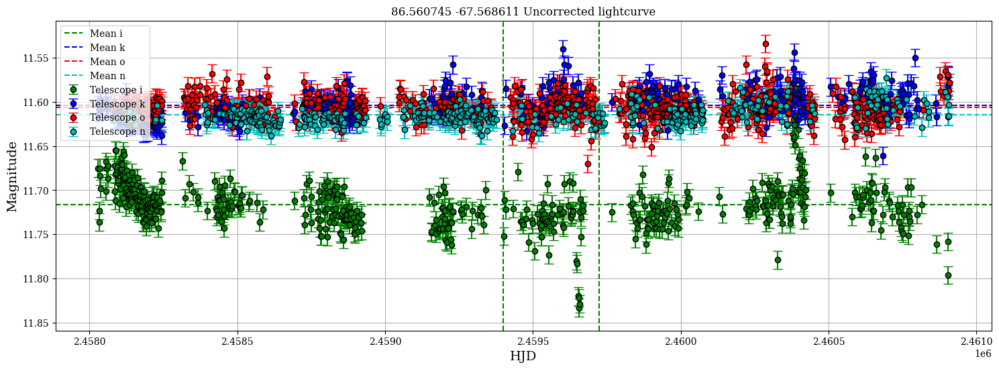

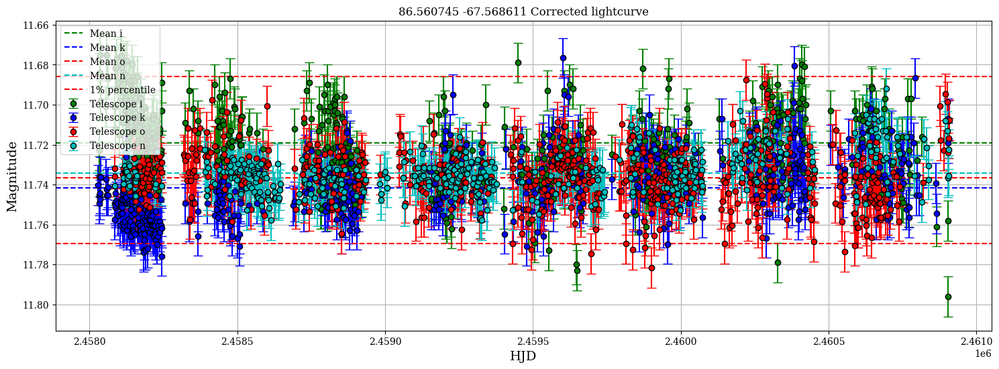

Best frequency: 0.473696 1/day, Best period: 2.11 days, Max power: 0.044, False alarm probability: 1.624e-17
False alarm level for 1.0%: 1.297e-02
Grid sampled at 19856 points


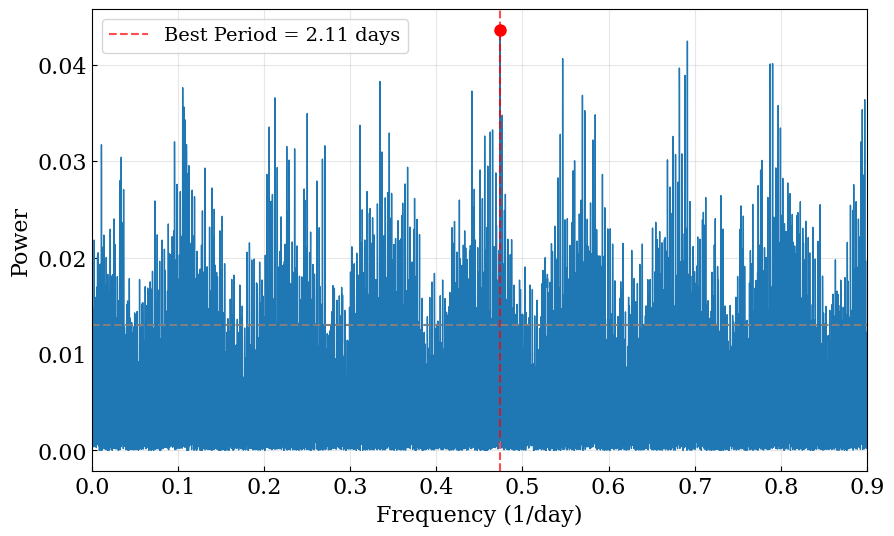

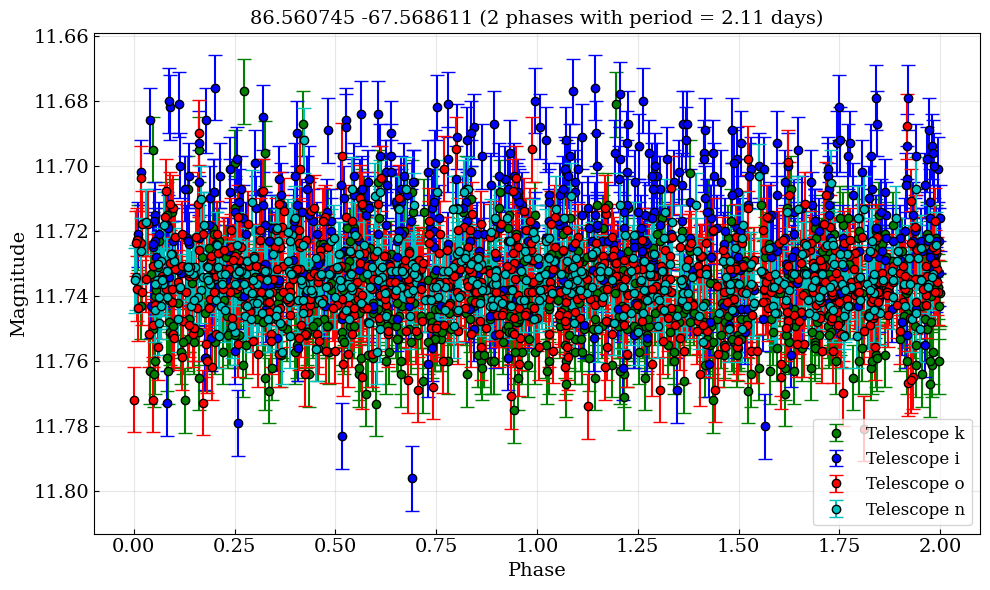

Average scatter (amplitude) per 10 point phase bin: 3.433 mJy


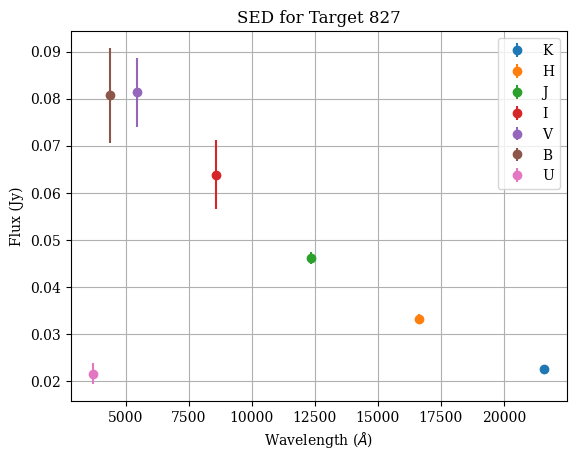

[0.00200847 0.00273317 0.00377492 0.00459021 0.00567726 0.00653784
 0.00726253 0.00839488 0.00943663 0.01011603 0.0110672  0.0117919
 0.01224483 0.0138754  0.01469069 0.01663832 0.01736301 0.01840477
 0.02026181 0.02125827 0.02297942 0.02402118 0.02569704 0.02664821
 0.02855054 0.02950171 0.03122287 0.03230991 0.03403107 0.03507282
 0.03679398 0.04064394 0.04141393 0.04340685 0.04426743 0.04612447
 0.04961208 0.05165029 0.05246558 0.05531908 0.05808199 0.05903315
 0.06188665 0.06374369 0.06483074 0.0665066  0.06759365 0.06926952
 0.07035656 0.07307418 0.07484063 0.07588239 0.07764884 0.07869059
 0.08136291 0.08417112 0.08494111 0.08584698 0.08688874 0.08774932
 0.08870048 0.08942518 0.09046693 0.0914181  0.09250515 0.09322985
 0.09522277 0.09590217 0.09698922 0.09798568 0.09875567 0.09975213
 0.10043153 0.10156387 0.10265092 0.10323974 0.10428149 0.10541383
 0.1070444  0.10817674 0.10980731 0.11089436 0.11270611 0.11356669
 0.11451785 0.11537843 0.11642018 0.11723547 0.11809605 0.11913

In [8]:
info(827) # bad LS

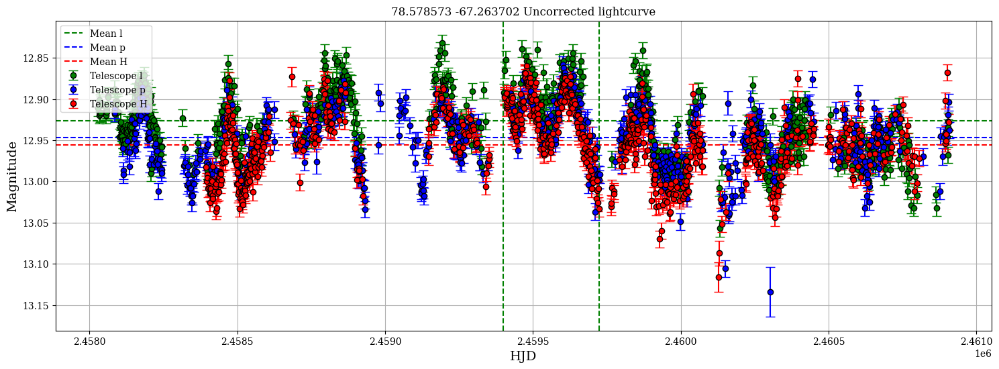

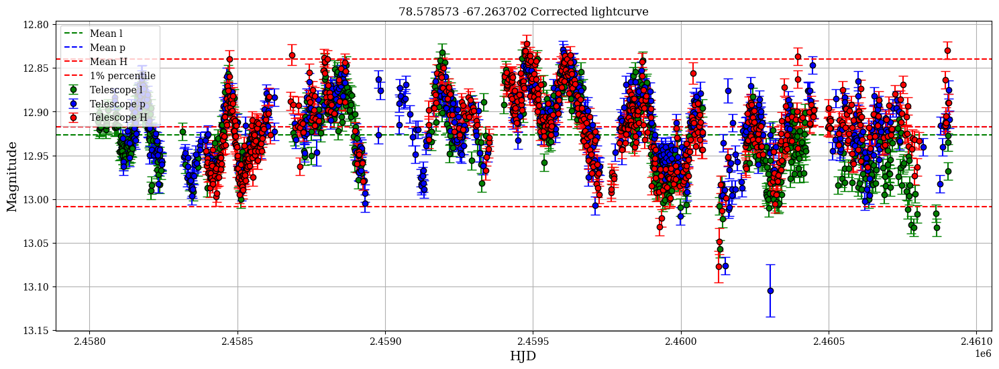

Best frequency: 0.004877 1/day, Best period: 205.05 days, Max power: 0.112, False alarm probability: 2.342e-46
False alarm level for 1.0%: 1.465e-02
Grid sampled at 17635 points


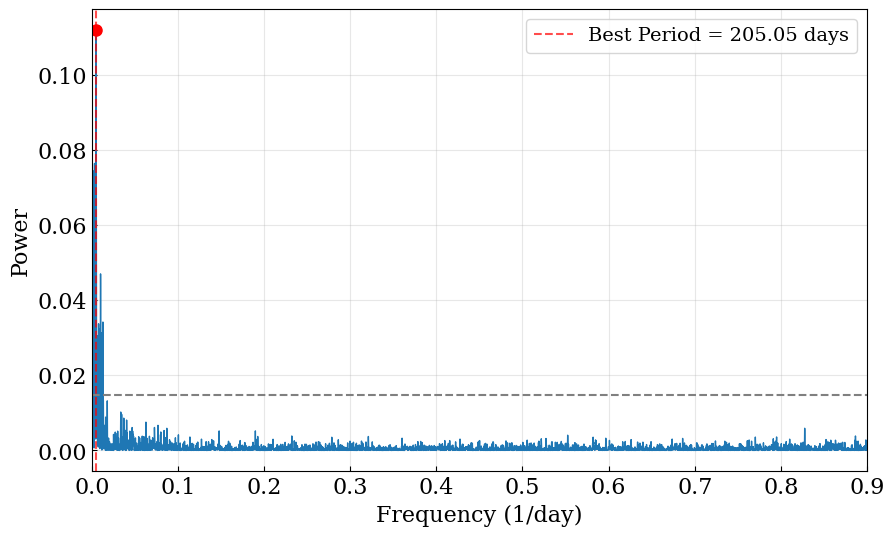

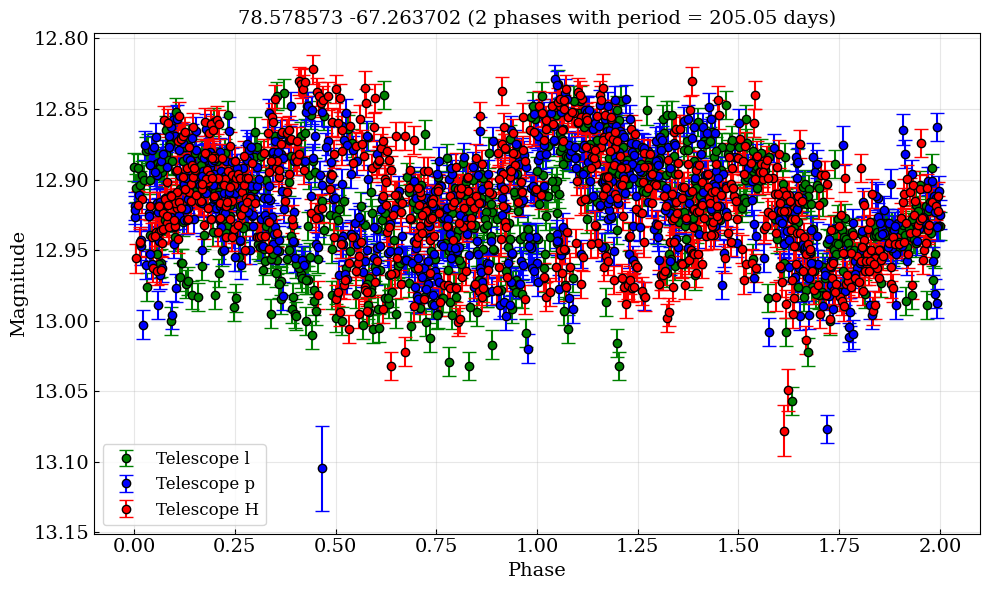

Average scatter (amplitude) per 10 point phase bin: 2.354 mJy


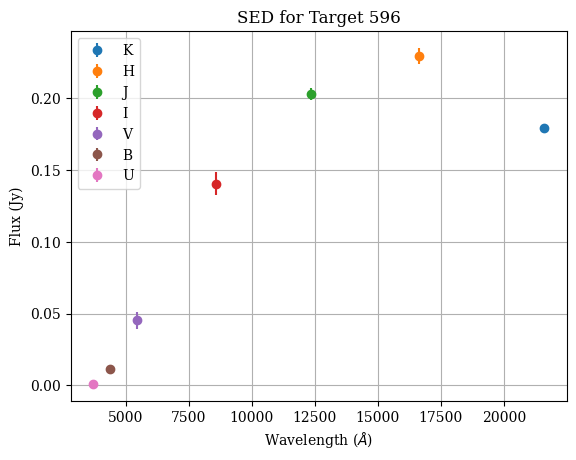

[0.00120494 0.00222491 0.00304088 0.00365286 0.00431584 0.00487682
 0.00630478 0.00706975 0.00773273 0.0087527  0.01002766 0.01058864
 0.01278157]
Amplitude metrics:
	Lower 5% percentile: -1.47 mJy, 12.86 mags
	Upper 5% percentile: 1.44 mJy, 12.98 mags
	Percentile amplitude of variability (excluding the brightest and dimmest 5% of data) (g-band: True): 2.91 mJy, 0.13 mags
Amplitude metrics:
	Lower 1% percentile: -1.98 mJy, 12.84 mags
	Upper 1% percentile: 1.84 mJy, 13.01 mags
	Percentile amplitude of variability (excluding the brightest and dimmest 1% of data) (g-band: True): 3.82 mJy, 0.17 mags
	Largest amplitude of variability (g-band: True): 6.16 mJy, 0.28 mags
	Average amplitude across all periods: 3.672 mJy
	Standard deviation of amplitudes: 0.932 mJy


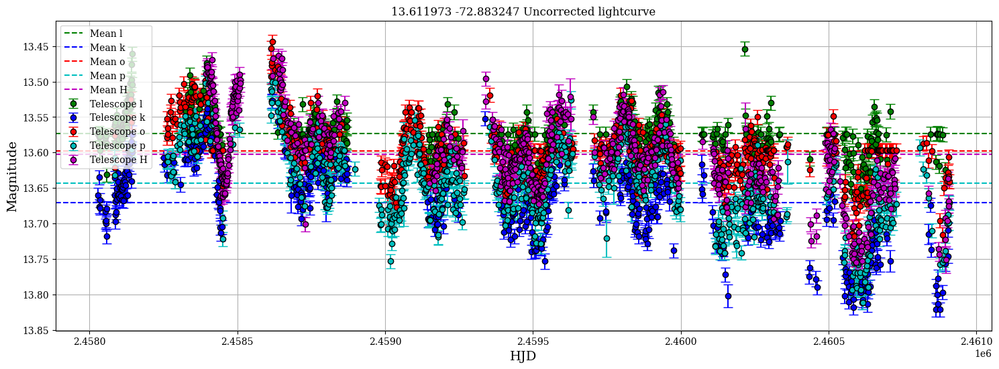

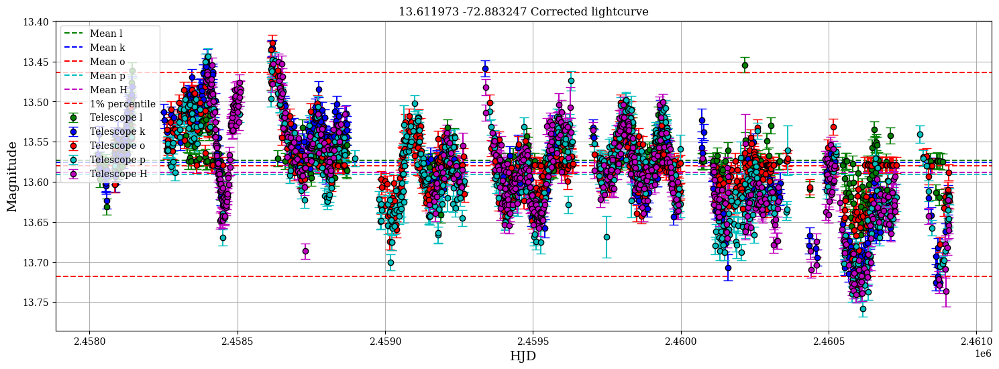

Best frequency: 0.002831 1/day, Best period: 353.19 days, Max power: 0.094, False alarm probability: 5.422e-54
False alarm level for 1.0%: 1.082e-02
Grid sampled at 24416 points


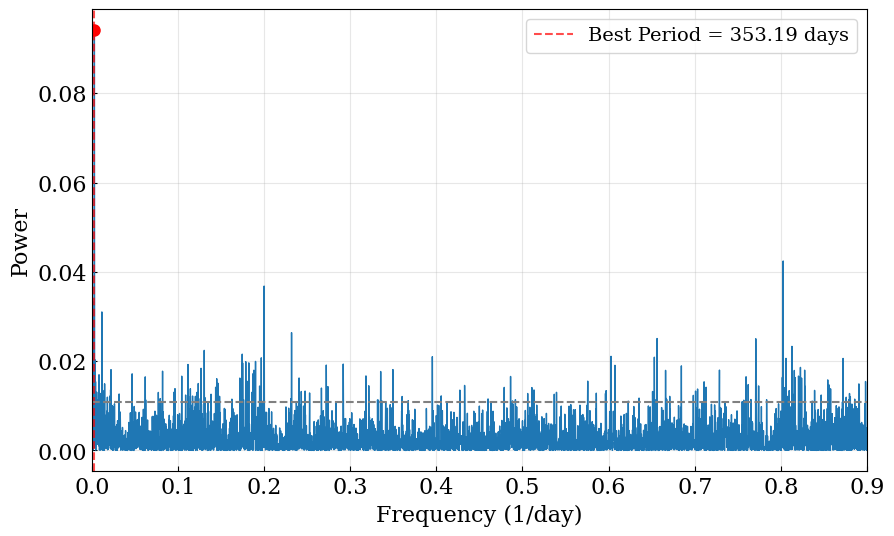

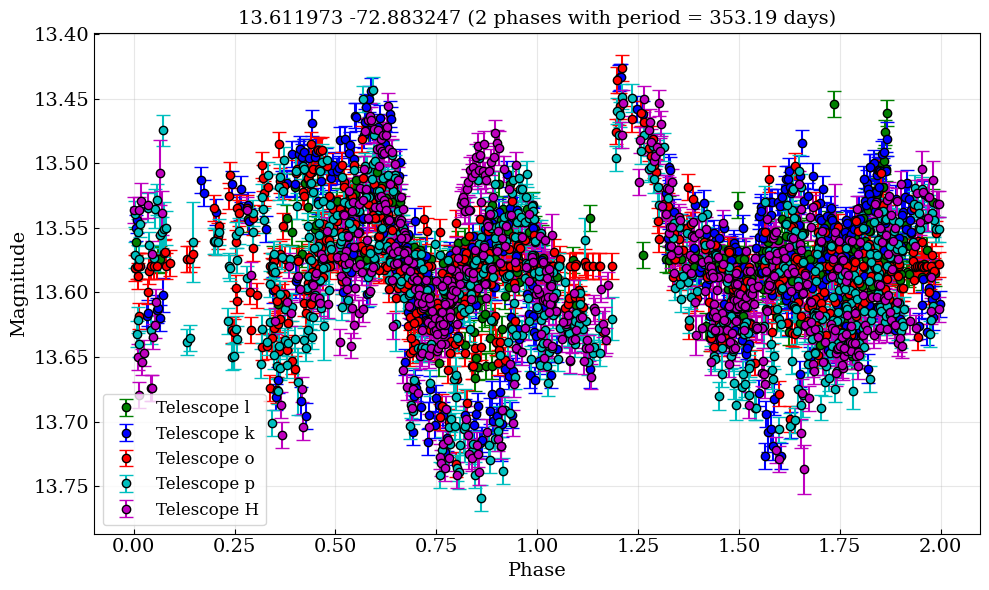

Average scatter (amplitude) per 10 point phase bin: 1.365 mJy


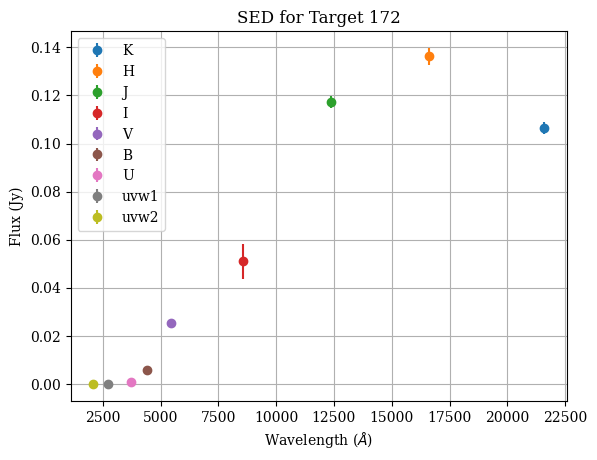

[7.31805321e-04 1.91049715e-03 2.83135014e-03 3.31019369e-03
 4.19421256e-03 4.78355847e-03 5.52024086e-03 6.62526445e-03
 8.24596571e-03 1.06033494e-02 1.10453588e-02 1.15610365e-02
 1.29975671e-02 1.42499272e-02 1.47287707e-02 1.79701733e-02
 2.06590640e-02 2.16904193e-02 2.21692629e-02 3.15987975e-02
 4.67007865e-02 6.19132779e-02 6.24289556e-02 7.71257693e-02
 7.93358164e-02 8.20247072e-02 9.54691608e-02 9.64636820e-02
 1.04309349e-01 1.08839946e-01 1.11565671e-01 1.12081349e-01
 1.14328230e-01 1.16869784e-01 1.20184855e-01 1.21952893e-01
 1.23499926e-01 1.23941935e-01 1.26741328e-01 1.30424740e-01
 1.31161423e-01 1.38344076e-01 1.43685023e-01 1.44937383e-01
 1.46447582e-01 1.48215620e-01 1.62580927e-01 1.71752622e-01
 1.74552015e-01 1.75030859e-01 1.76062214e-01 1.78640603e-01
 1.79966631e-01 1.82176678e-01 1.86081095e-01 1.87296621e-01
 1.88070137e-01 1.89027824e-01 1.89985512e-01 1.94737113e-01
 1.96689321e-01 1.97241833e-01 2.00004392e-01 2.31129223e-01
 2.31829071e-01 2.405587

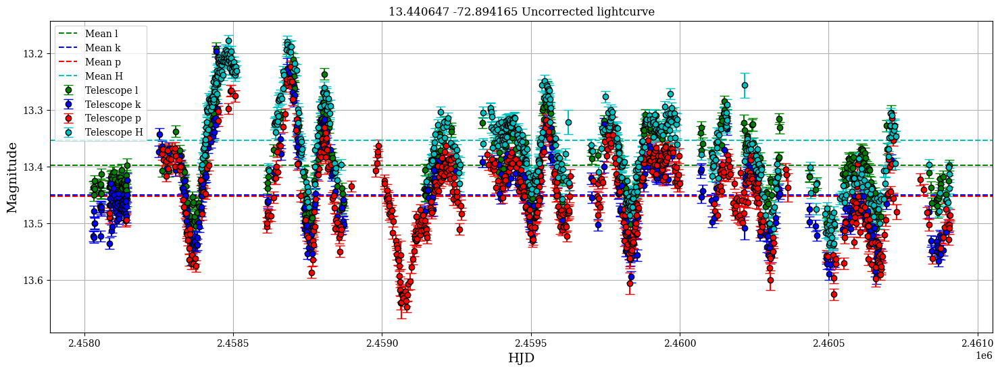

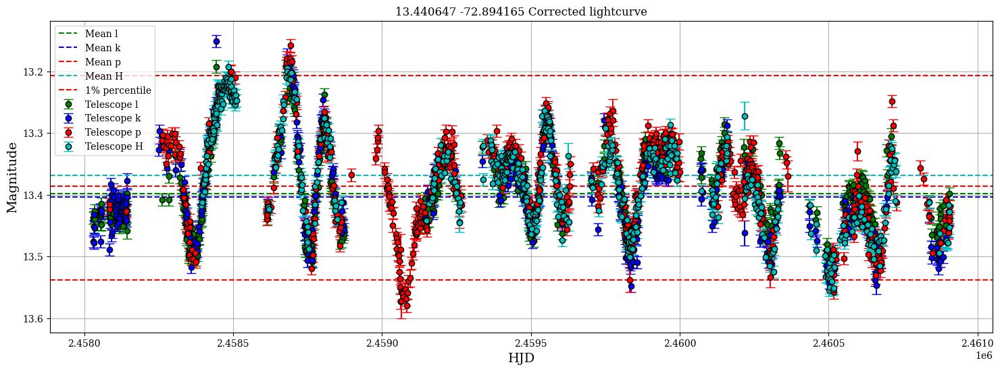

Best frequency: 0.001290 1/day, Best period: 775.36 days, Max power: 0.123, False alarm probability: 2.097e-58
False alarm level for 1.0%: 1.295e-02
Grid sampled at 19658 points


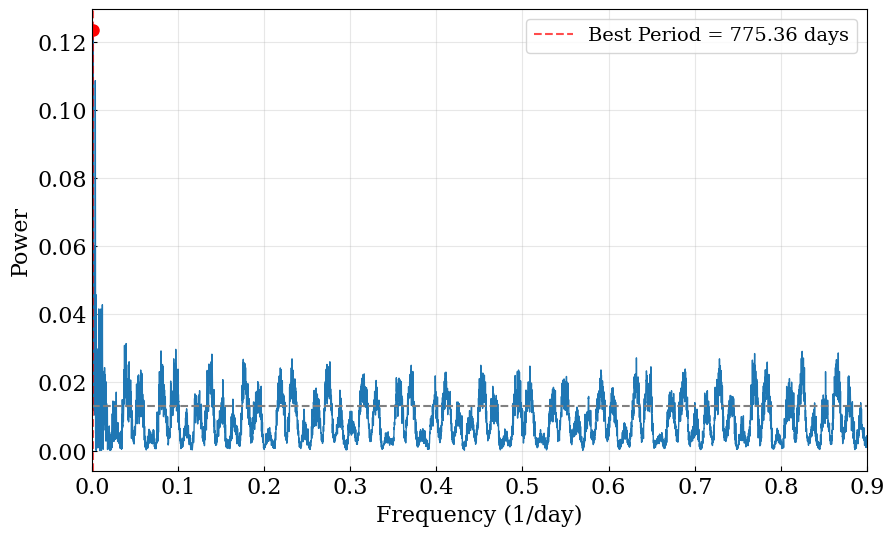

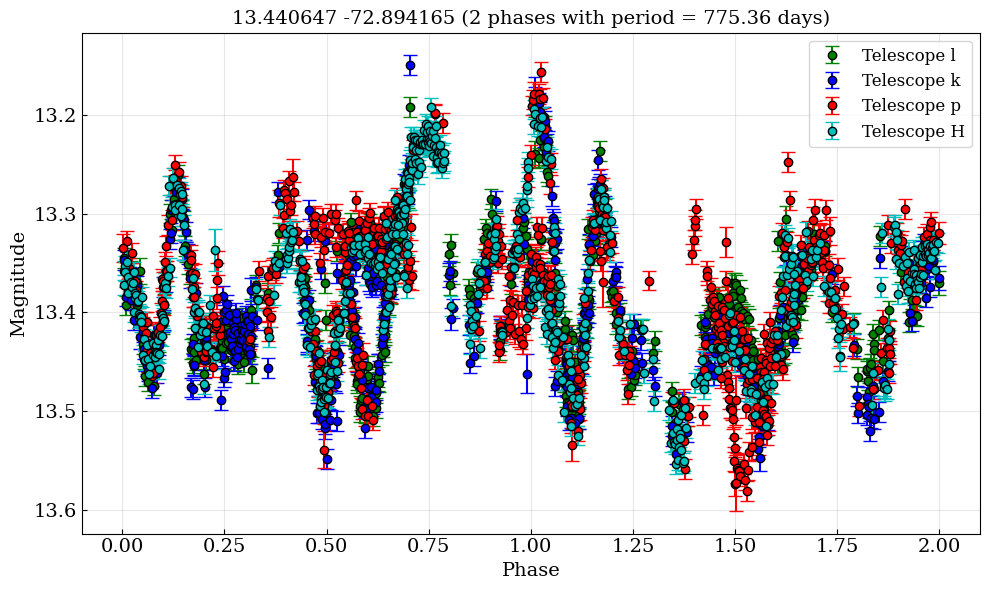

Average scatter (amplitude) per 10 point phase bin: 1.288 mJy


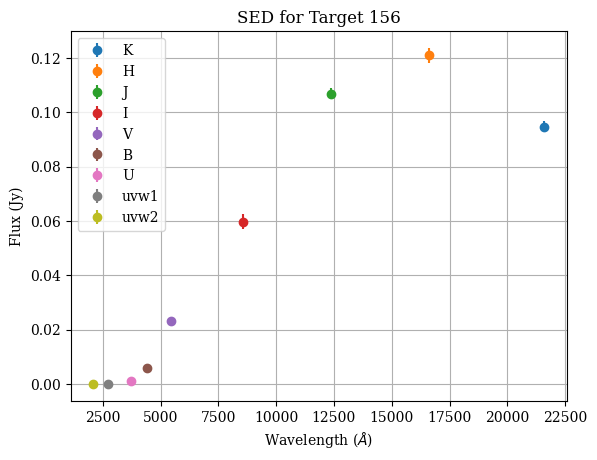

[7.86470924e-04 1.28971940e-03 2.15896677e-03 2.66221525e-03
 3.43996290e-03 3.94321137e-03 4.58370943e-03 5.08695791e-03
 5.63595625e-03 6.18495459e-03 7.51170057e-03 7.96919919e-03
 8.79269670e-03 9.57044435e-03 1.03481920e-02 1.08514405e-02
 1.13546889e-02 1.21324366e-02 1.29559341e-02 1.34591826e-02
 1.42369302e-02 1.46944288e-02 1.52434272e-02 1.61584244e-02
 1.70276718e-02 1.78969191e-02 2.44391494e-02 2.62691438e-02
 2.67723923e-02 2.75958898e-02 2.82363879e-02 3.52818665e-02
 3.61968638e-02 3.73863602e-02 3.78438588e-02 3.83013574e-02
 3.90333552e-02 3.97653530e-02 4.04973508e-02 4.09548494e-02
 4.14580979e-02 4.23273452e-02 4.31965926e-02 4.36998411e-02
 4.42945893e-02 4.49350873e-02 4.56670851e-02 5.10198189e-02
 5.18433164e-02 5.28955632e-02 5.33530619e-02 5.41765594e-02
 5.46340580e-02 5.53660558e-02 5.59150541e-02 5.66470519e-02
 5.71960502e-02 5.79280480e-02 5.84312965e-02 5.89345450e-02
 5.97580425e-02 6.02155411e-02 7.76004885e-02 7.83782361e-02
 7.88814846e-02 7.965923

In [9]:
# all in upper right
info(596)
info(172)
info(156)

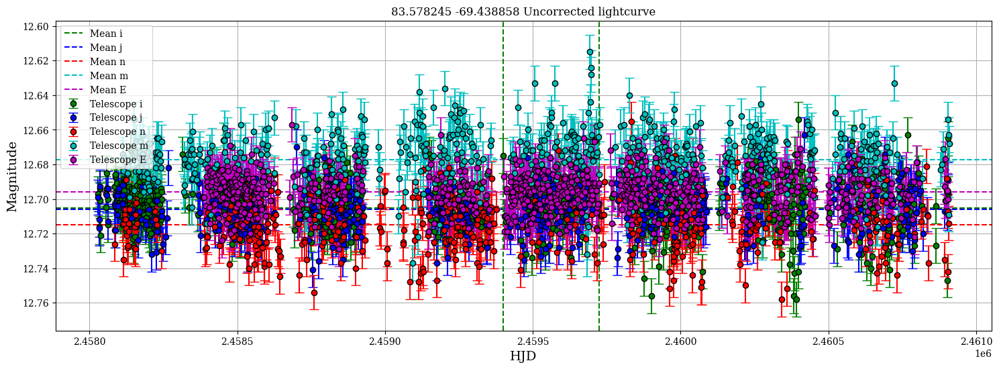

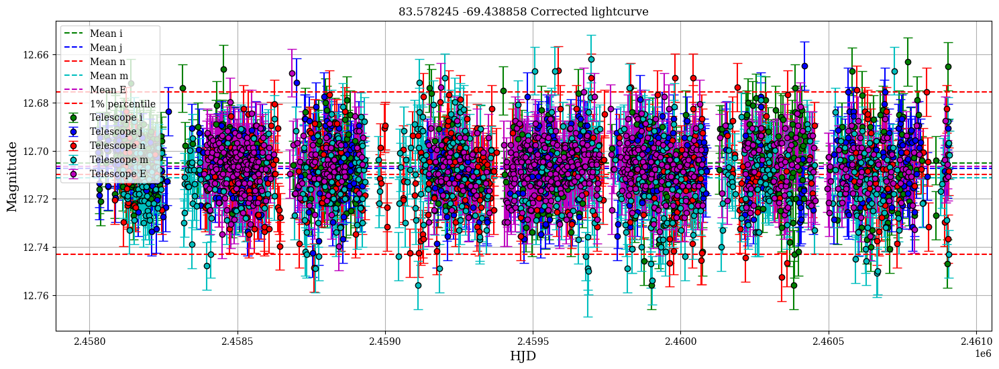

Best frequency: 0.263114 1/day, Best period: 3.80 days, Max power: 0.023, False alarm probability: 6.057e-11
False alarm level for 1.0%: 9.875e-03
Grid sampled at 26961 points


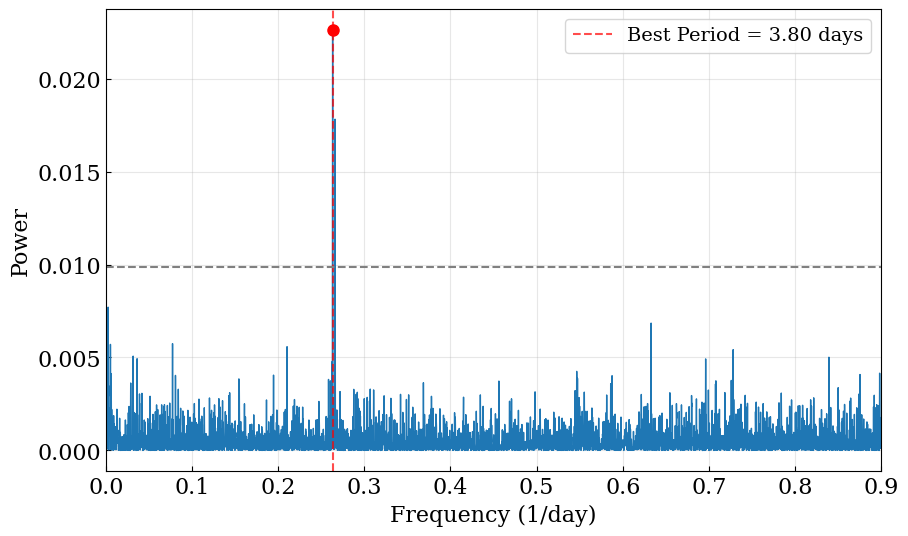

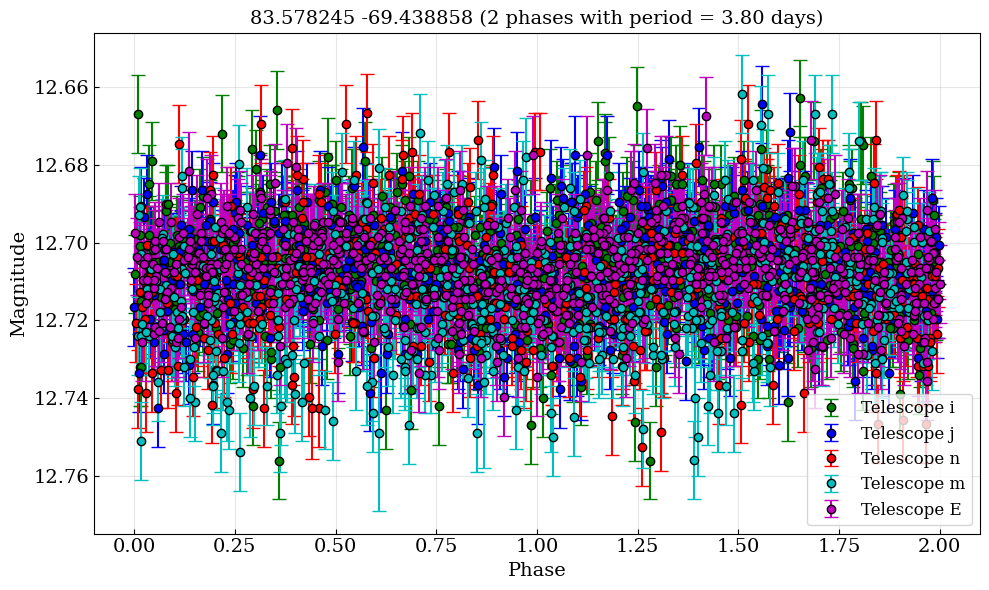

Average scatter (amplitude) per 10 point phase bin: 1.079 mJy


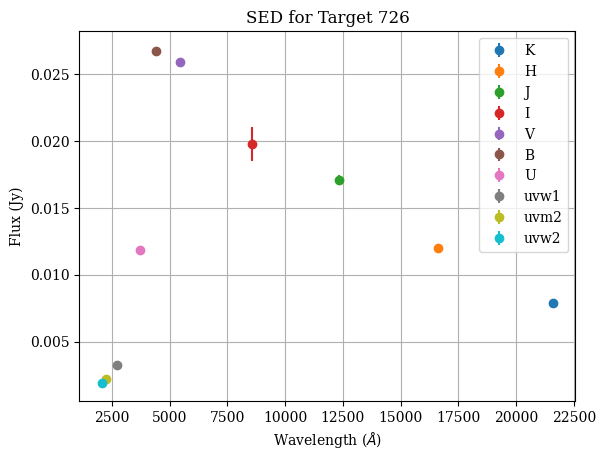

[0.2631144  0.26591639]
Amplitude metrics:
	Lower 5% percentile: -0.63 mJy, 12.69 mags
	Upper 5% percentile: 0.57 mJy, 12.73 mags
	Percentile amplitude of variability (excluding the brightest and dimmest 5% of data) (g-band: True): 1.20 mJy, 0.04 mags
Amplitude metrics:
	Lower 1% percentile: -0.96 mJy, 12.68 mags
	Upper 1% percentile: 0.89 mJy, 12.74 mags
	Percentile amplitude of variability (excluding the brightest and dimmest 1% of data) (g-band: True): 1.85 mJy, 0.07 mags
	Largest amplitude of variability (g-band: True): 2.60 mJy, 0.09 mags
	Average amplitude across all periods: 0.883 mJy
	Standard deviation of amplitudes: 0.372 mJy


In [10]:
info(726)

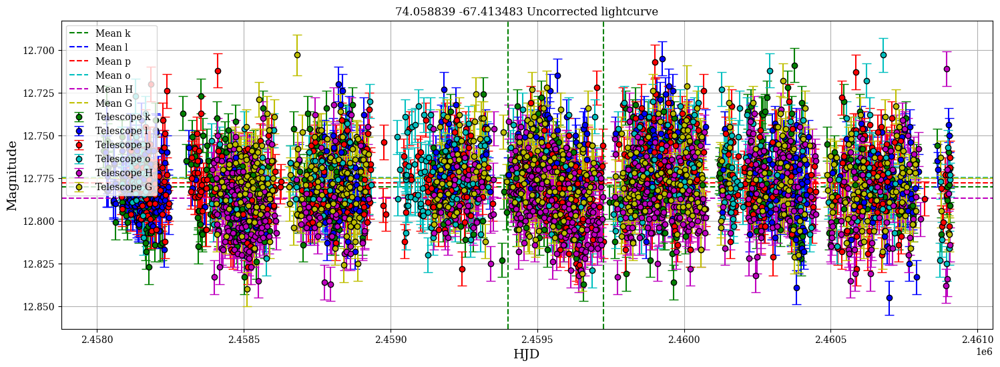

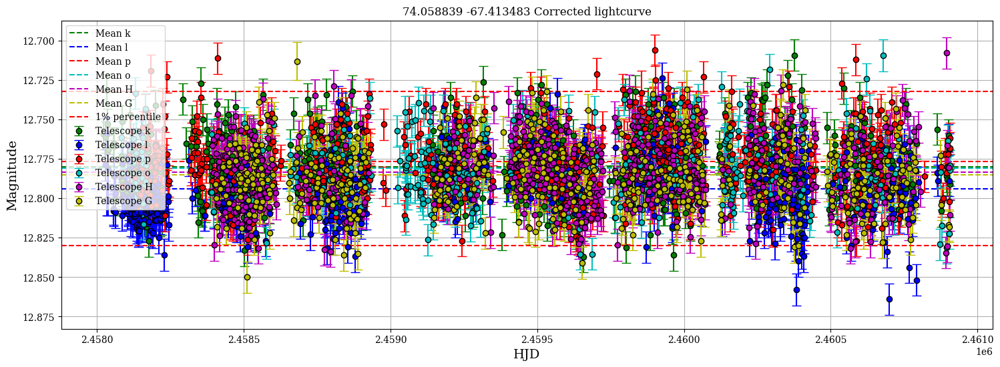

Best frequency: 0.277344 1/day, Best period: 3.61 days, Max power: 0.246, False alarm probability: 4.538e-203
False alarm level for 1.0%: 8.839e-03
Grid sampled at 30486 points


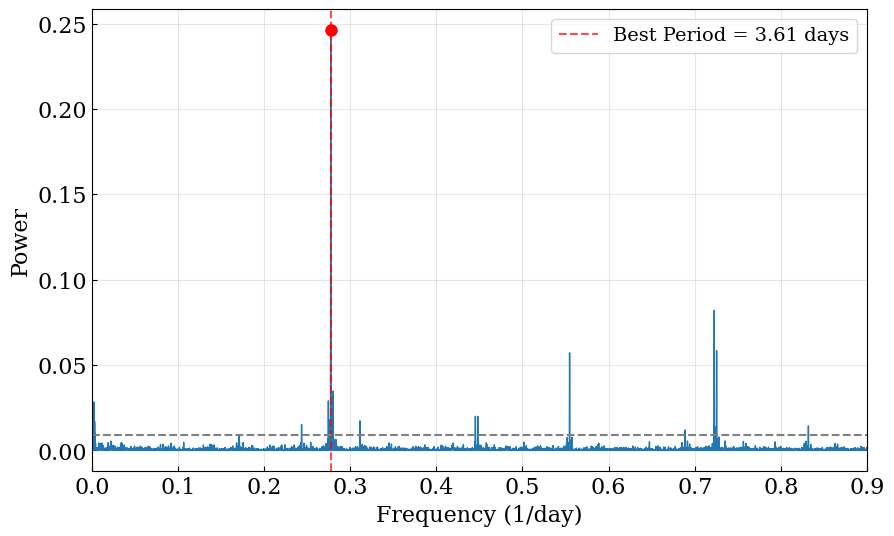

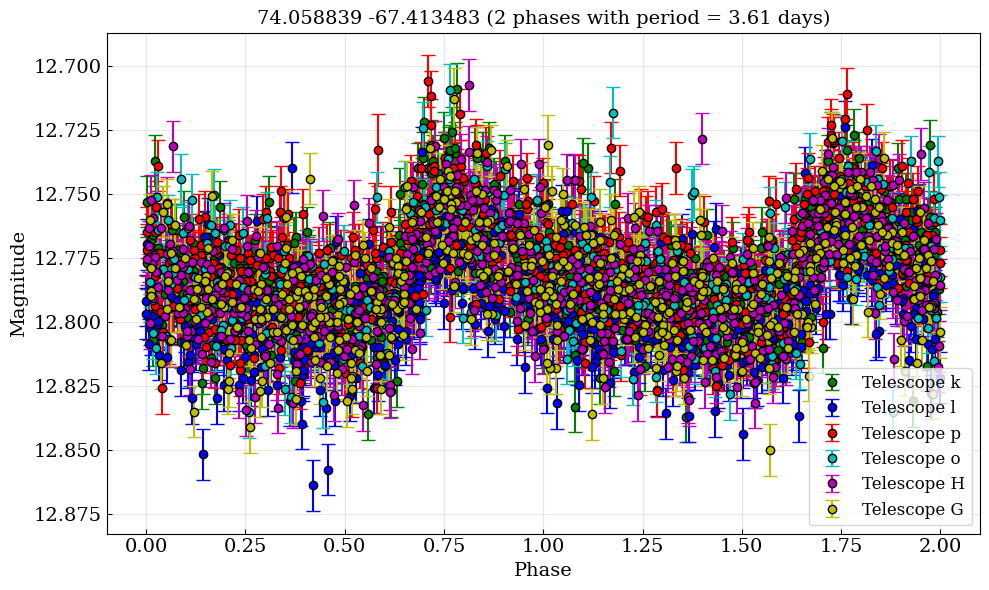

Average scatter (amplitude) per 10 point phase bin: 1.318 mJy


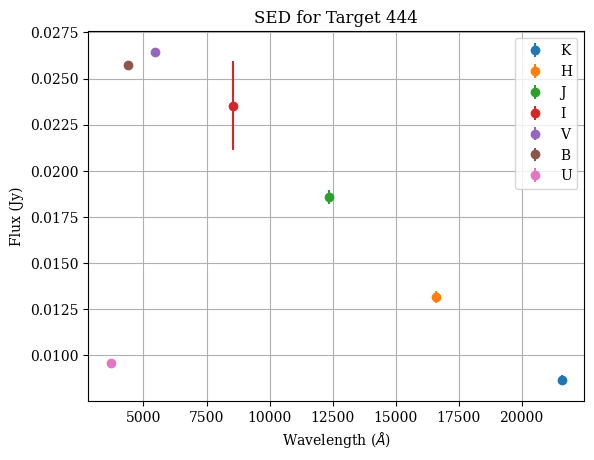

[0.00131278 0.00258128 0.00314178 0.00349578 0.24344857 0.27457104
 0.27684254 0.27734404 0.27784554 0.28011704 0.31129851 0.4453169
 0.44808989 0.5547028  0.68875068 0.72267565 0.72317715 0.72544865
 0.83203206]
Amplitude metrics:
	Lower 5% percentile: -0.80 mJy, 12.75 mags
	Upper 5% percentile: 1.01 mJy, 12.82 mags
	Percentile amplitude of variability (excluding the brightest and dimmest 5% of data) (g-band: True): 1.80 mJy, 0.07 mags
Amplitude metrics:
	Lower 1% percentile: -1.14 mJy, 12.73 mags
	Upper 1% percentile: 1.39 mJy, 12.83 mags
	Percentile amplitude of variability (excluding the brightest and dimmest 1% of data) (g-band: True): 2.52 mJy, 0.10 mags
	Largest amplitude of variability (g-band: True): 4.06 mJy, 0.16 mags
	Average amplitude across all periods: 1.353 mJy
	Standard deviation of amplitudes: 0.464 mJy


In [11]:
info(444)

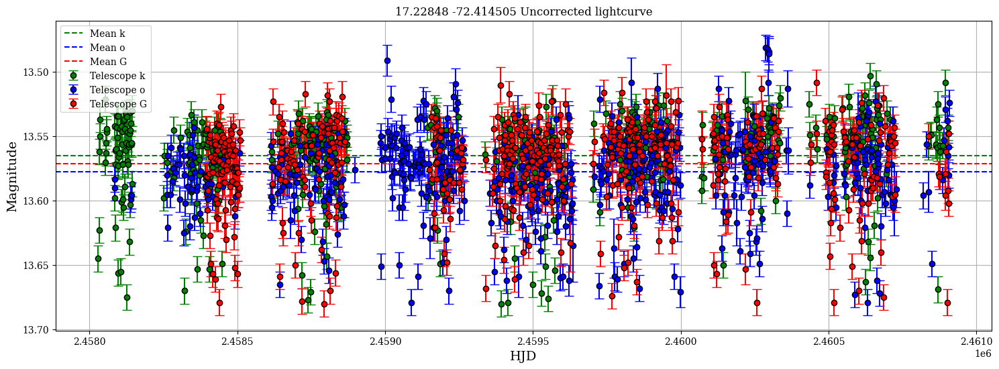

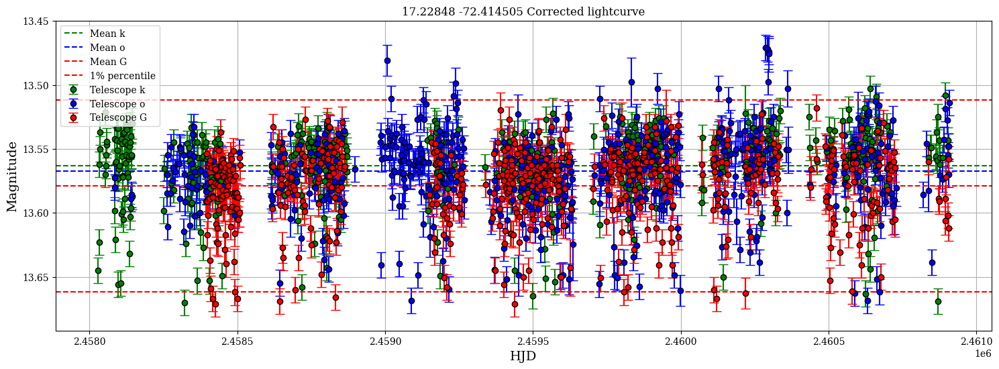

Best frequency: 0.453347 1/day, Best period: 2.21 days, Max power: 0.389, False alarm probability: 1.878e-175
False alarm level for 1.0%: 1.682e-02
Grid sampled at 15144 points


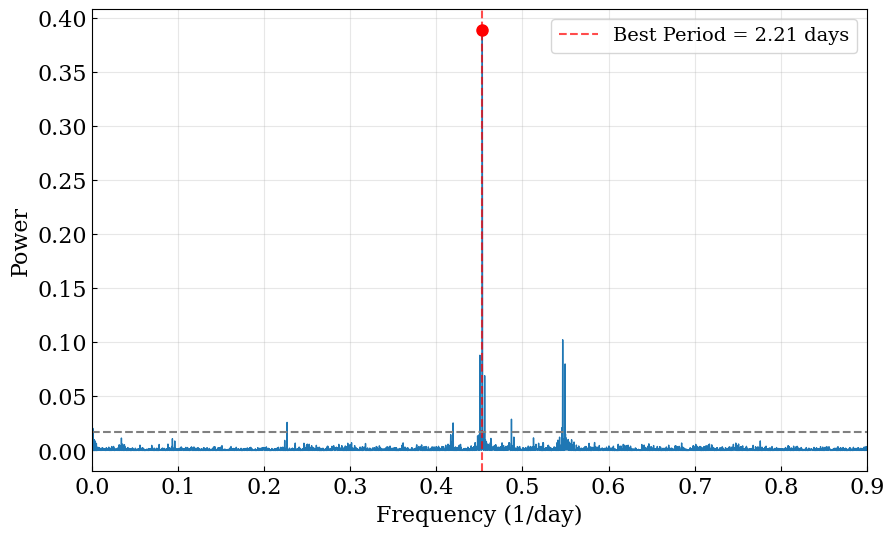

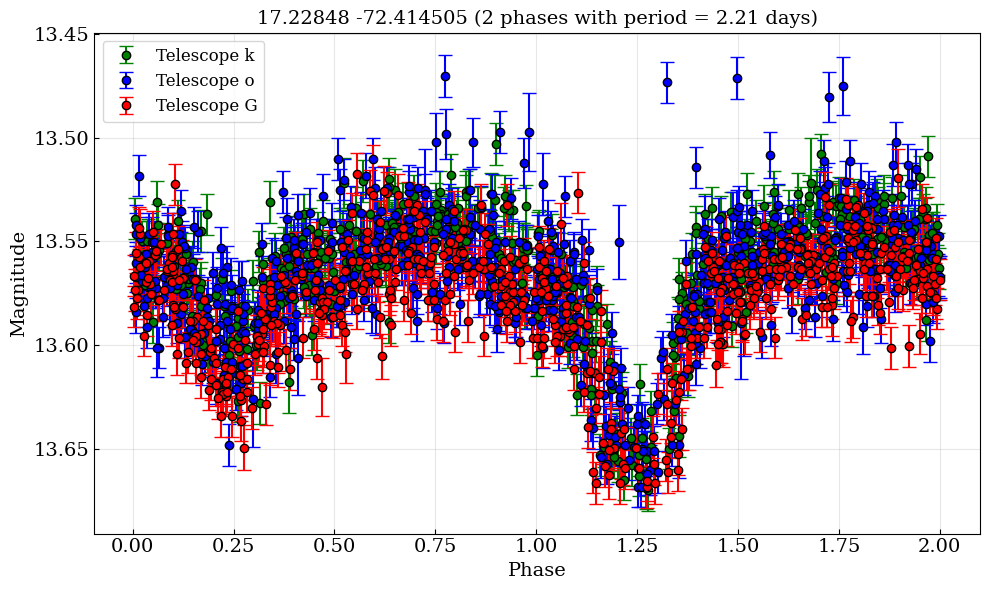

Average scatter (amplitude) per 10 point phase bin: 0.730 mJy


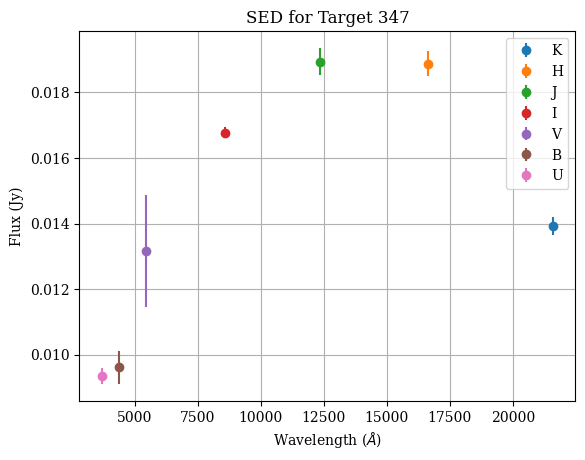

[0.0010513  0.22666444 0.41943629 0.45055534 0.45334655 0.45607838
 0.48719743 0.54587229 0.54670372 0.54949493]
Amplitude metrics:
	Lower 5% percentile: -0.80 mJy, 13.53 mags
	Upper 5% percentile: 0.46 mJy, 13.63 mags
	Percentile amplitude of variability (excluding the brightest and dimmest 5% of data) (g-band: True): 1.26 mJy, 0.10 mags
Amplitude metrics:
	Lower 1% percentile: -1.15 mJy, 13.51 mags
	Upper 1% percentile: 0.69 mJy, 13.66 mags
	Percentile amplitude of variability (excluding the brightest and dimmest 1% of data) (g-band: True): 1.84 mJy, 0.15 mags
	Largest amplitude of variability (g-band: True): 2.50 mJy, 0.20 mags
	Average amplitude across all periods: 0.549 mJy
	Standard deviation of amplitudes: 0.376 mJy


In [12]:
info(347)

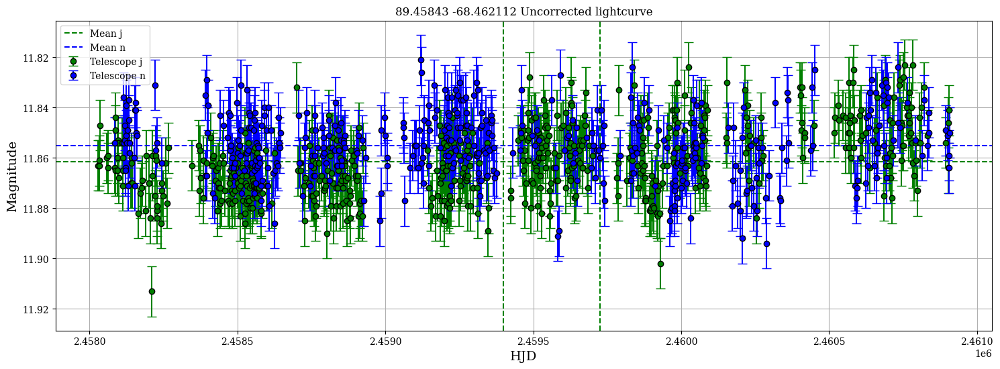

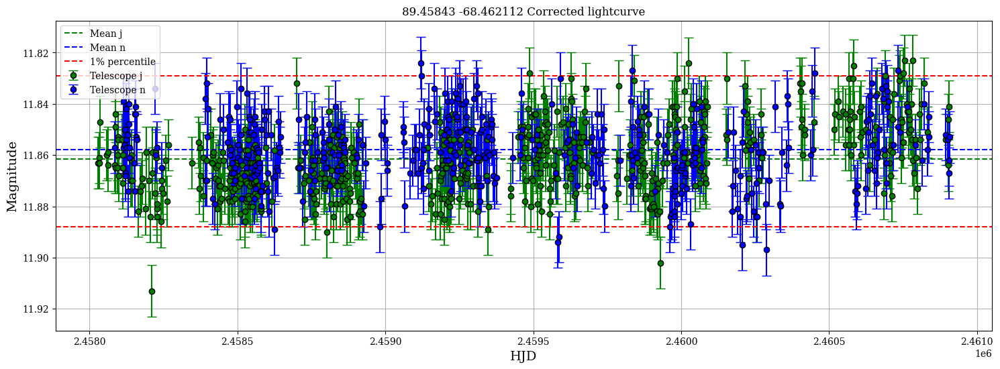

Best frequency: 0.224609 1/day, Best period: 4.45 days, Max power: 0.183, False alarm probability: 1.239e-40
False alarm level for 1.0%: 2.672e-02
Grid sampled at 9118 points


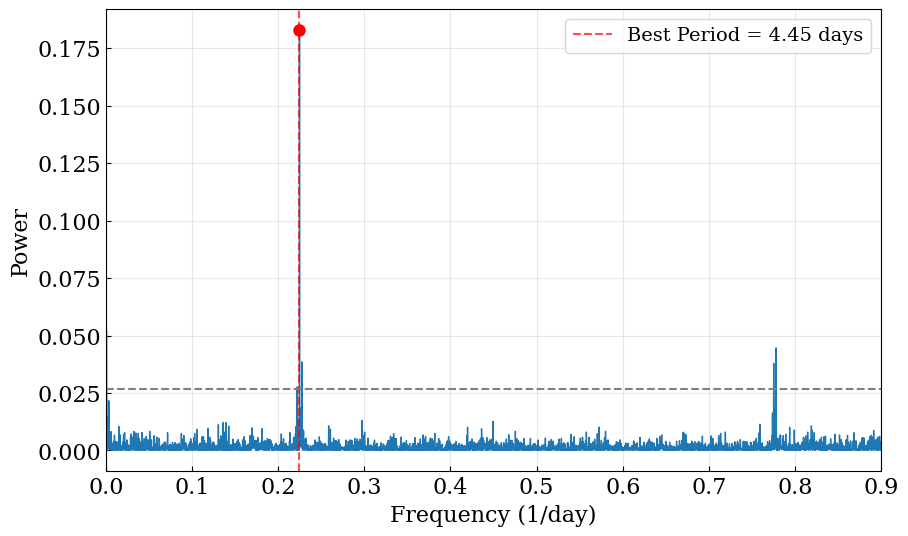

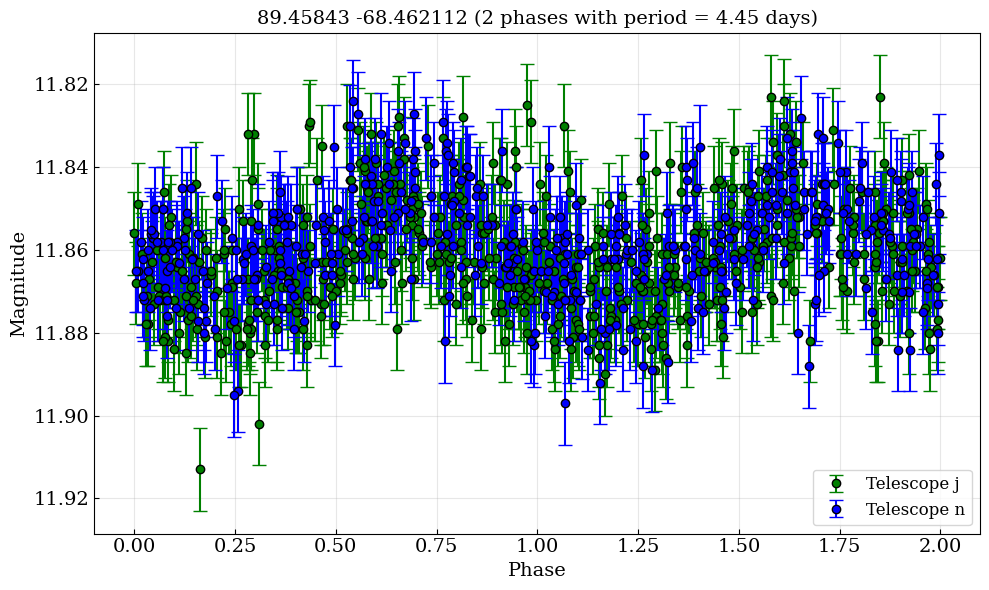

Average scatter (amplitude) per 10 point phase bin: 2.084 mJy


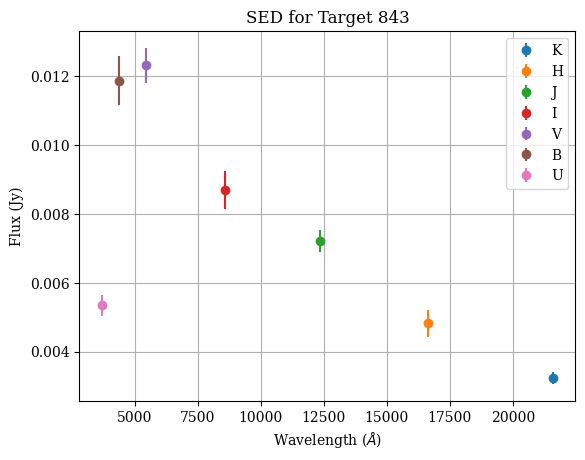

[0.22194568 0.22460897 0.22737091 0.7753185  0.77808043]
Amplitude metrics:
	Lower 5% percentile: -1.22 mJy, 11.84 mags
	Upper 5% percentile: 1.42 mJy, 11.88 mags
	Percentile amplitude of variability (excluding the brightest and dimmest 5% of data) (g-band: True): 2.64 mJy, 0.04 mags
Amplitude metrics:
	Lower 1% percentile: -1.62 mJy, 11.83 mags
	Upper 1% percentile: 1.94 mJy, 11.89 mags
	Percentile amplitude of variability (excluding the brightest and dimmest 1% of data) (g-band: True): 3.57 mJy, 0.06 mags
	Largest amplitude of variability (g-band: True): 5.37 mJy, 0.09 mags
	Average amplitude across all periods: 1.135 mJy
	Standard deviation of amplitudes: 0.706 mJy


In [13]:
info(843)

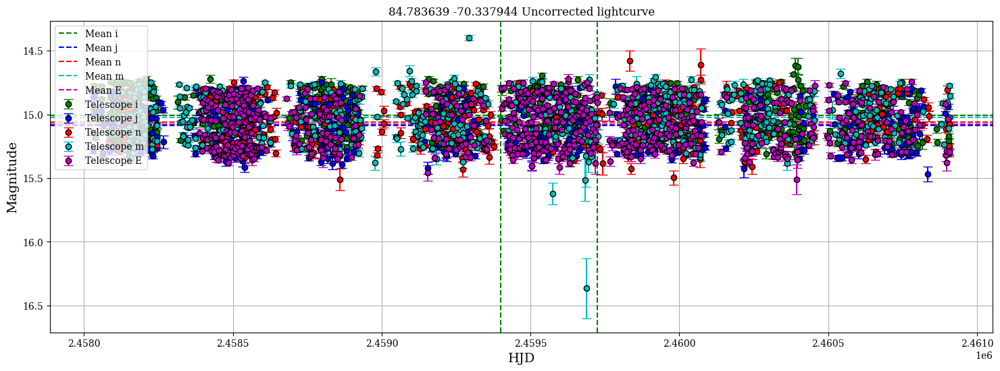

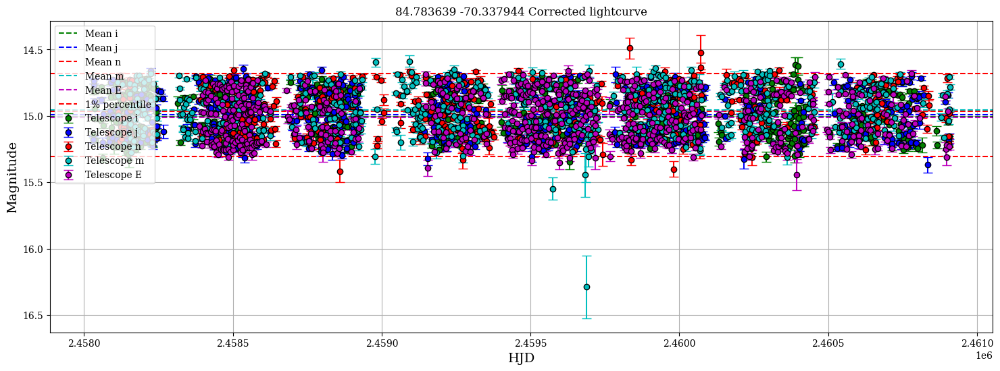

Best frequency: 0.125592 1/day, Best period: 7.96 days, Max power: 0.859, False alarm probability: 0.000e+00
False alarm level for 1.0%: 9.858e-03
Grid sampled at 27024 points


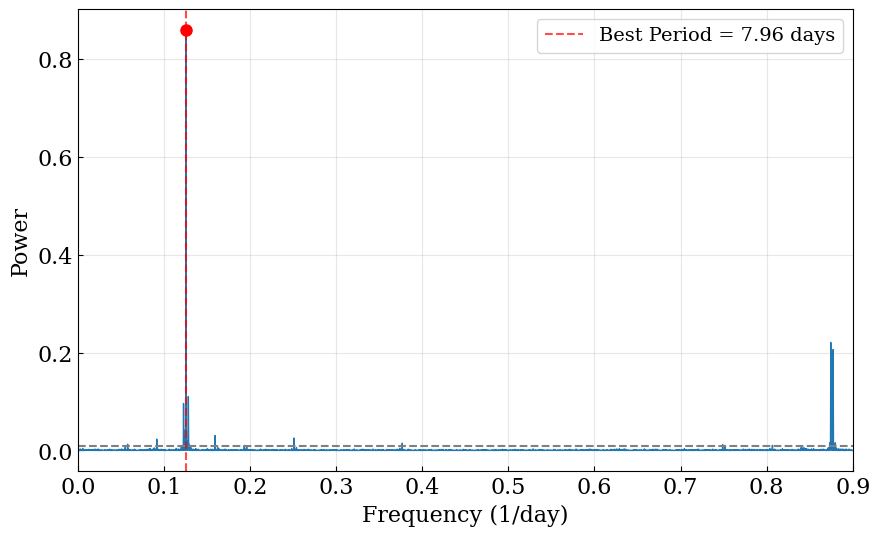

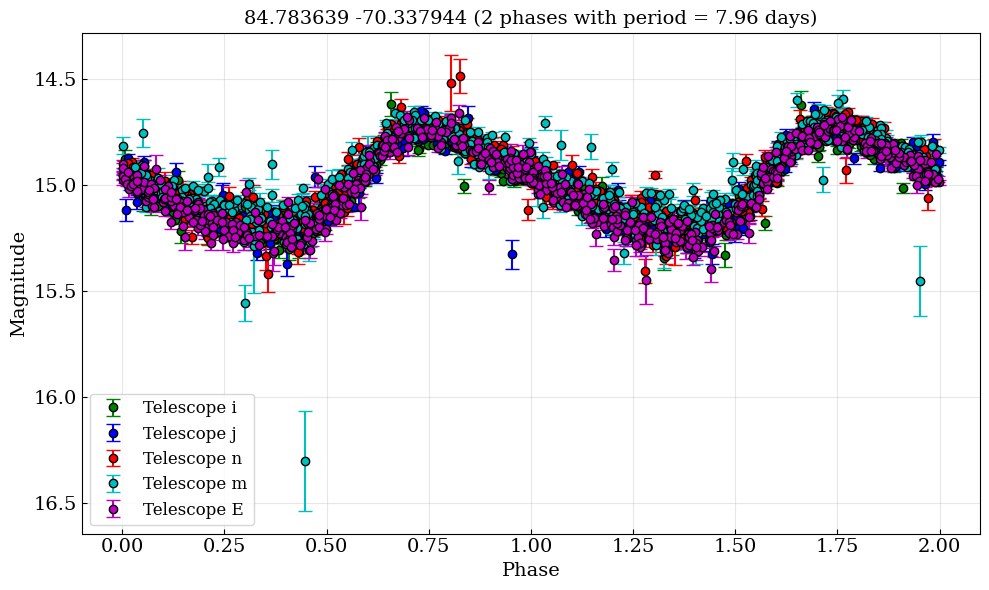

Average scatter (amplitude) per 10 point phase bin: 0.542 mJy


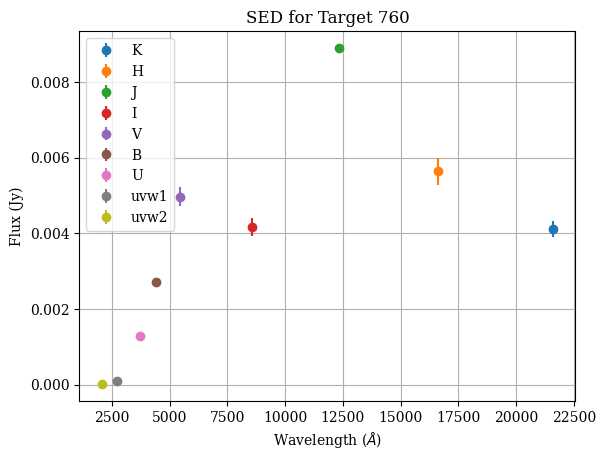

[0.05786848 0.09171348 0.12229711 0.1227963  0.1247265  0.12505929
 0.12559176 0.12609095 0.12645702 0.12785475 0.12838722 0.12881985
 0.15947004 0.19331504 0.25115439 0.37675029 0.74891219 0.80665169
 0.87357627 0.87394234 0.87444153 0.87494072 0.87563959 0.87720371
 0.87800241 0.87883439 0.87973293]
Amplitude metrics:
	Lower 5% percentile: -0.74 mJy, 14.73 mags
	Upper 5% percentile: 1.01 mJy, 15.24 mags
	Percentile amplitude of variability (excluding the brightest and dimmest 5% of data) (g-band: True): 1.75 mJy, 0.51 mags
Amplitude metrics:
	Lower 1% percentile: -0.92 mJy, 14.68 mags
	Upper 1% percentile: 1.21 mJy, 15.30 mags
	Percentile amplitude of variability (excluding the brightest and dimmest 1% of data) (g-band: True): 2.13 mJy, 0.62 mags
	Largest amplitude of variability (g-band: True): 4.71 mJy, 1.80 mags
	Average amplitude across all periods: 1.718 mJy
	Standard deviation of amplitudes: 0.332 mJy
	Average amplitude (1.718 mJy) is greater than 5 sigma (0.332 mJy). This indi

In [14]:
info(760)

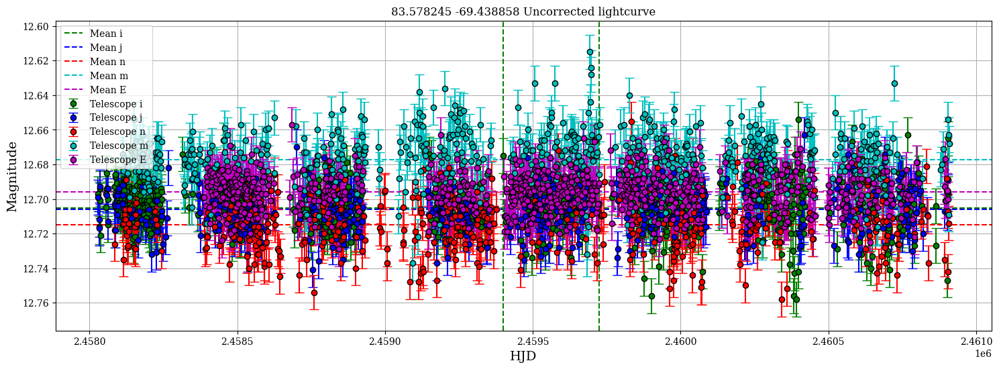

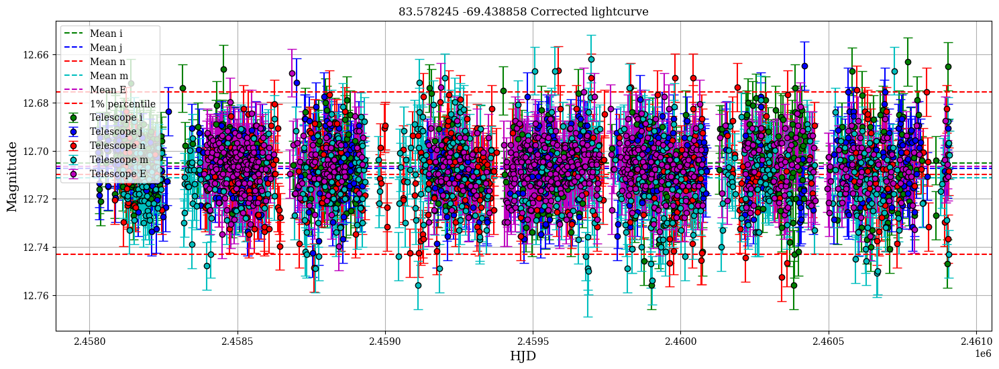

Best frequency: 0.263114 1/day, Best period: 3.80 days, Max power: 0.023, False alarm probability: 6.057e-11
False alarm level for 1.0%: 9.875e-03
Grid sampled at 26961 points


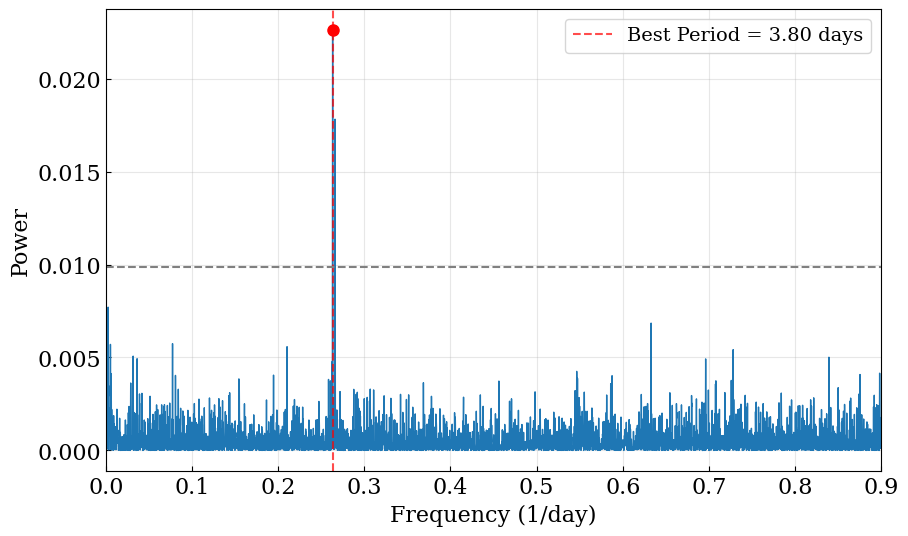

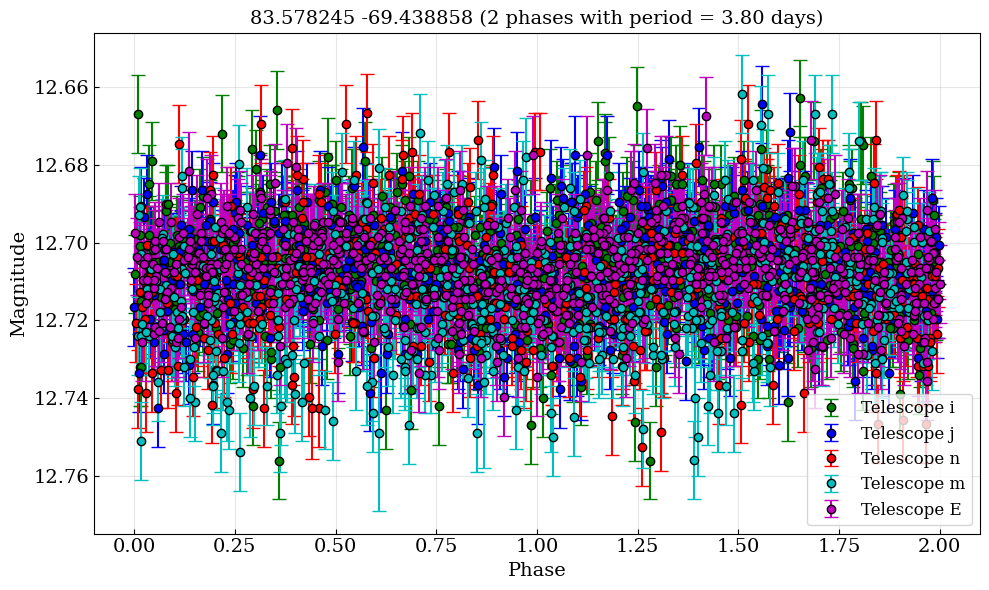

Average scatter (amplitude) per 10 point phase bin: 1.079 mJy


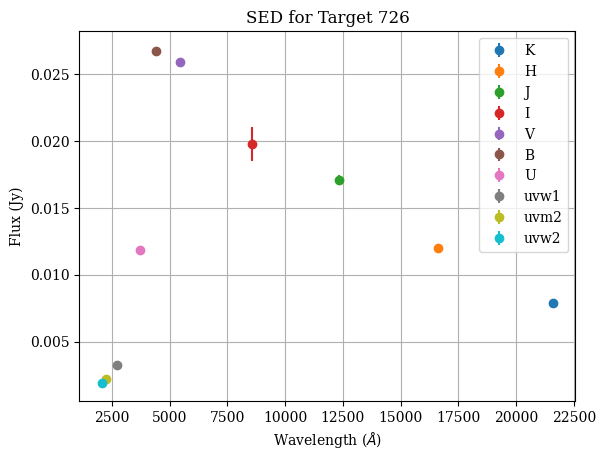

[0.2631144  0.26591639]
Amplitude metrics:
	Lower 5% percentile: -0.63 mJy, 12.69 mags
	Upper 5% percentile: 0.57 mJy, 12.73 mags
	Percentile amplitude of variability (excluding the brightest and dimmest 5% of data) (g-band: True): 1.20 mJy, 0.04 mags
Amplitude metrics:
	Lower 1% percentile: -0.96 mJy, 12.68 mags
	Upper 1% percentile: 0.89 mJy, 12.74 mags
	Percentile amplitude of variability (excluding the brightest and dimmest 1% of data) (g-band: True): 1.85 mJy, 0.07 mags
	Largest amplitude of variability (g-band: True): 2.60 mJy, 0.09 mags
	Average amplitude across all periods: 0.883 mJy
	Standard deviation of amplitudes: 0.372 mJy


In [15]:
info(726)